# **Install Pandas Profiling**

In [1]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

     / 38.3MB 1.2MB/s
     |████████████████████████████████| 10.1MB 202kB/s 
     |████████████████████████████████| 645kB 38.5MB/s 
     |████████████████████████████████| 112kB 46.7MB/s 
     |████████████████████████████████| 1.1MB 34.4MB/s 
     |████████████████████████████████| 3.1MB 34.8MB/s 
     |████████████████████████████████| 61kB 7.4MB/s 
     |████████████████████████████████| 81kB 9.5MB/s 
     |████████████████████████████████| 296kB 32.9MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.0.0-py2.py3-none-any.whl size=248525 sha256=12e447a48257384d7ef713e71f7aea48826be0ec89cfe490c82cdf96ad559131
  Stored in directory: /tmp/pip-ephem-wheel-cache-ld4birvt/wheels/56/c2/dd/8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp37-none-any.whl size=27099 sha256=95ea1cf00c71fe47b6ba155b578fea5f43f0b111106bf9fdffe0ec4e63d2cbd0
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f9406

In [2]:
pip install --upgrade plotly

     |████████████████████████████████| 13.2MB 127kB/s 
  Found existing installation: plotly 4.4.1
    Uninstalling plotly-4.4.1:
      Successfully uninstalled plotly-4.4.1


# Import required **library**

In [3]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.figure_factory as ff
from matplotlib import pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
%matplotlib inline


/usr/local/lib/python3.7/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


# Import (covid_19)india **Data**

In [4]:
covid_india=pd.read_csv("/content/drive/MyDrive/Dataset/Covid_india/covid_19_india.csv")

Dispaly data

In [5]:
covid_india

,Sno,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed
0,1,2020-01-30,6:00 PM,Kerala,1,0,0,0,1
1,2,2020-01-31,6:00 PM,Kerala,1,0,0,0,1
2,3,2020-02-01,6:00 PM,Kerala,2,0,0,0,2
3,4,2020-02-02,6:00 PM,Kerala,3,0,0,0,3
4,5,2020-02-03,6:00 PM,Kerala,3,0,0,0,3
...,...,...,...,...,...,...,...,...,...
15801,15802,2021-06-08,8:00 AM,Telangana,-,-,564303,3394,593103
15802,15803,2021-06-08,8:00 AM,Tripura,-,-,49579,572,56169
15803,15804,2021-06-08,8:00 AM,Uttarakhand,-,-,313566,6731,334419
15804,15805,2021-06-08,8:00 AM,Uttar Pradesh,-,-,1662069,21333,1699083


In [6]:
covid_india.head()

,Sno,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed
0,1,2020-01-30,6:00 PM,Kerala,1,0,0,0,1
1,2,2020-01-31,6:00 PM,Kerala,1,0,0,0,1
2,3,2020-02-01,6:00 PM,Kerala,2,0,0,0,2
3,4,2020-02-02,6:00 PM,Kerala,3,0,0,0,3
4,5,2020-02-03,6:00 PM,Kerala,3,0,0,0,3


# **Correlation**

In [7]:
correl = covid_india[['ConfirmedIndianNational', 'ConfirmedForeignNational', 'Cured', 'Deaths', 'Confirmed']]
correl.head()

,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed
0,1,0,0,0,1
1,1,0,0,0,1
2,2,0,0,0,2
3,3,0,0,0,3
4,3,0,0,0,3


Regression Plot between Cured and Deaths


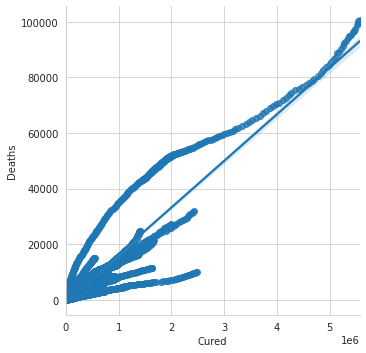

In [64]:
sns.set_style('whitegrid')
sns.lmplot(x ='Cured', y ='Deaths', data = covid_india)
print("Regression Plot between Cured and Deaths")

In [8]:
correl.corr()

,Cured,Deaths,Confirmed
Cured,1.000000,0.910045,0.996711
Deaths,0.910045,1.000000,0.910530
Confirmed,0.996711,0.910530,1.000000


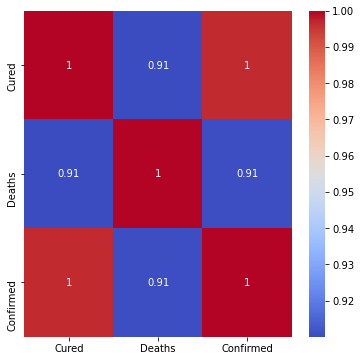

In [9]:
#Heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(correl.corr(), annot=True, cmap="coolwarm")

#**Handling Missing Values**

# Find the total count, mean, standard deviation, minimum value, maximum value

In [10]:
covid_india.describe()

,Sno,Cured,Deaths,Confirmed
count,15806.000000,1.580600e+04,15806.000000,1.580600e+04
mean,7903.500000,1.986514e+05,3004.846324,2.204181e+05
std,4562.943513,4.299306e+05,7919.358996,4.781429e+05
min,1.000000,0.000000e+00,0.000000,0.000000e+00
25%,3952.250000,2.082000e+03,15.000000,3.291250e+03
50%,7903.500000,2.293950e+04,385.000000,2.927950e+04
75%,11854.750000,2.208698e+05,2690.500000,2.472700e+05
max,15806.000000,5.564348e+06,100470.000000,5.842000e+06


In [11]:
#show how many nulls
covid_india.isnull().sum()

Sno                         0
Date                        0
Time                        0
State/UnionTerritory        0
ConfirmedIndianNational     0
ConfirmedForeignNational    0
Cured                       0
Deaths                      0
Confirmed                   0
dtype: int64

In [12]:
#deleting sno , ConfirmedIndianNational,ConfirmedForeignNational
covid_india = covid_india.drop(['Sno','ConfirmedIndianNational', 'ConfirmedForeignNational'], axis=1)
covid_india.head()

,Date,Time,State/UnionTerritory,Cured,Deaths,Confirmed
0,2020-01-30,6:00 PM,Kerala,0,0,1
1,2020-01-31,6:00 PM,Kerala,0,0,1
2,2020-02-01,6:00 PM,Kerala,0,0,2
3,2020-02-02,6:00 PM,Kerala,0,0,3
4,2020-02-03,6:00 PM,Kerala,0,0,3


# Use Pandas Profiling for **covid_19_india**

In [13]:
profile= ProfileReport(covid_india, title="covid_19_india", html={'style':{'full_width':False}})

In [14]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/19 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# **Top 10 States with highest number of Confirmed cases**

In [15]:
confirm = covid_india.groupby("State/UnionTerritory")["Confirmed"].sum().reset_index()

In [16]:
confirm.head()

,State/UnionTerritory,Confirmed
0,Andaman and Nicobar Islands,1461311
1,Andhra Pradesh,270440364
2,Arunachal Pradesh,4619157
3,Assam,66322683
4,Bihar,87441641


In [17]:
x1 = confirm.nlargest(10,"Confirmed")["State/UnionTerritory"]
y1 = confirm.nlargest(10,"Confirmed")["Confirmed"]

In [18]:
fig = px.bar(x=x1,y=y1,color_discrete_sequence=px.colors.diverging.Picnic,title="Top 10 states with Confirmed Cases")

fig.update_yaxes(title_text='Number of Confirmed cases')
fig.update_xaxes(title_text='Top 10 states')

fig.show()

# **Top 10 States with highest number of Cured cases**

In [19]:
cured = covid_india.groupby("State/UnionTerritory")["Cured"].sum().reset_index()

In [20]:
cured.head()

,State/UnionTerritory,Cured
0,Andaman and Nicobar Islands,1381883
1,Andhra Pradesh,251842054
2,Arunachal Pradesh,4257945
3,Assam,61027980
4,Bihar,81029353


In [21]:
x1 = cured.nlargest(10,"Cured")["State/UnionTerritory"]
y1 = cured.nlargest(10,"Cured")["Cured"]

In [22]:
fig = px.bar(x=x1,y=y1,color_discrete_sequence=px.colors.sequential.Sunset,title="Top 10 states with Cured Cases")

fig.update_yaxes(title_text='Number of Cured cases')
fig.update_xaxes(title_text='Top 10 states')

fig.show()

# **Top 10 States which are getting affected by the number of Deaths**

In [23]:
deaths = covid_india.groupby("State/UnionTerritory")["Deaths"].sum().reset_index()

In [24]:
deaths.head()

,State/UnionTerritory,Deaths
0,Andaman and Nicobar Islands,18944
1,Andhra Pradesh,2117572
2,Arunachal Pradesh,14682
3,Assam,335961
4,Bihar,502330


In [25]:
x1 = deaths.nlargest(10,"Deaths")["State/UnionTerritory"]
y1 = deaths.nlargest(10,"Deaths")["Deaths"]

In [26]:
fig = px.bar(x=x1,y=y1,color_discrete_sequence=px.colors.diverging.RdYlBu,title="Top 10 states which are affecting from deaths")

fig.update_yaxes(title_text='Number of Deaths')
fig.update_xaxes(title_text='Top 10 states')

fig.show()

In [27]:
px.treemap(deaths,path=["State/UnionTerritory"],values="Deaths",title="Overall States Comparision of deaths")

# **covid_vaccine_statewise**

In [28]:
covid_vaccine_statewise=pd.read_csv("/content/drive/MyDrive/Dataset/Covid_india/covid_vaccine_statewise.csv")

In [29]:
covid_vaccine_statewise

,Updated On,State,Total Individuals Vaccinated,Total Sessions Conducted,Total Sites,First Dose Administered,Second Dose Administered,Male(Individuals Vaccinated),Female(Individuals Vaccinated),Transgender(Individuals Vaccinated),Total Covaxin Administered,Total CoviShield Administered,Total Sputnik V Administered,AEFI,18-45 years (Age),45-60 years (Age),60+ years (Age),Total Doses Administered
0,16/01/2021,India,48276.0,3455.0,2957.0,48276.0,0.0,23757.0,24517.0,2.0,579.0,47697.0,NaN,NaN,NaN,NaN,NaN,48276.0
1,17/01/2021,India,58604.0,8532.0,4954.0,58604.0,0.0,27348.0,31252.0,4.0,635.0,57969.0,NaN,NaN,NaN,NaN,NaN,58604.0
2,18/01/2021,India,99449.0,13611.0,6583.0,99449.0,0.0,41361.0,58083.0,5.0,1299.0,98150.0,NaN,NaN,NaN,NaN,NaN,99449.0
3,19/01/2021,India,195525.0,17855.0,7951.0,195525.0,0.0,81901.0,113613.0,11.0,3017.0,192508.0,NaN,NaN,NaN,NaN,NaN,195525.0
4,20/01/2021,India,251280.0,25472.0,10504.0,251280.0,0.0,98111.0,153145.0,24.0,3946.0,247334.0,NaN,NaN,NaN,NaN,NaN,251280.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5323,04/06/2021,West Bengal,11795260.0,937852.0,2500.0,11795260.0,3931230.0,6615547.0,5178013.0,1700.0,1749972.0,13976518.0,0.0,1210.0,2874071.0,4810523.0,4107132.0,15726490.0
5324,05/06/2021,West Bengal,12090072.0,981547.0,2517.0,12090072.0,3941080.0,6784722.0,5303588.0,1762.0,1806377.0,14224775.0,0.0,1211.0,2999339.0,4927157.0,4159589.0,16031152.0
5325,06/06/2021,West Bengal,12206706.0,479793.0,1016.0,12206706.0,3943243.0,6851075.0,5353848.0,1783.0,1825771.0,14324178.0,0.0,1214.0,3058135.0,4968447.0,4175911.0,16149949.0
5326,07/06/2021,West Bengal,12492937.0,1062959.0,2523.0,12492937.0,3960942.0,7014307.0,5476794.0,1836.0,1878776.0,14575103.0,0.0,1223.0,3174029.0,5087762.0,4226545.0,16453879.0


# **Regression Plot**

Regression Plot between First Dose and Second Dose


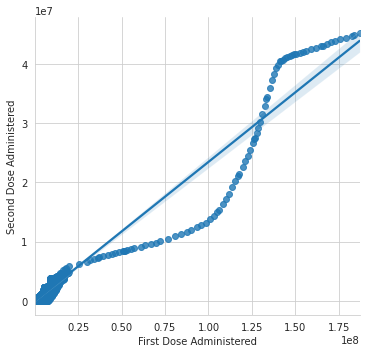

In [53]:
sns.set_style('whitegrid')
sns.lmplot(x ='First Dose Administered', y ='Second Dose Administered', data = covid_vaccine_statewise)
print("Regression Plot between First Dose and Second Dose")

# **Correlation**

In [30]:
correl2 = covid_vaccine_statewise[['Total Individuals Vaccinated', 'Total Sessions Conducted', 'First Dose Administered', 'Second Dose Administered', 'Male(Individuals Vaccinated)', 'Female(Individuals Vaccinated)', 'Transgender(Individuals Vaccinated)', 'Total Covaxin Administered', 'Total CoviShield Administered', 'Total Doses Administered']]
correl2.head()

,Total Individuals Vaccinated,Total Sessions Conducted,First Dose Administered,Second Dose Administered,Male(Individuals Vaccinated),Female(Individuals Vaccinated),Transgender(Individuals Vaccinated),Total Covaxin Administered,Total CoviShield Administered,Total Doses Administered
0,48276.0,3455.0,48276.0,0.0,23757.0,24517.0,2.0,579.0,47697.0,48276.0
1,58604.0,8532.0,58604.0,0.0,27348.0,31252.0,4.0,635.0,57969.0,58604.0
2,99449.0,13611.0,99449.0,0.0,41361.0,58083.0,5.0,1299.0,98150.0,99449.0
3,195525.0,17855.0,195525.0,0.0,81901.0,113613.0,11.0,3017.0,192508.0,195525.0
4,251280.0,25472.0,251280.0,0.0,98111.0,153145.0,24.0,3946.0,247334.0,251280.0


In [31]:
correl2.corr()

,Total Individuals Vaccinated,Total Sessions Conducted,First Dose Administered,Second Dose Administered,Male(Individuals Vaccinated),Female(Individuals Vaccinated),Transgender(Individuals Vaccinated),Total Covaxin Administered,Total CoviShield Administered,Total Doses Administered
Total Individuals Vaccinated,1.000000,0.931072,0.999919,0.977566,0.999842,0.999801,0.992778,0.988180,0.999293,0.999110
Total Sessions Conducted,0.931072,1.000000,0.929967,0.859015,0.930357,0.931529,0.901775,0.893312,0.921646,0.919456
First Dose Administered,0.999919,0.929967,1.000000,0.977472,0.999733,0.999751,0.992876,0.988298,0.999331,0.999157
Second Dose Administered,0.977566,0.859015,0.977472,1.000000,0.978791,0.975820,0.985465,0.988914,0.983864,0.985313
Male(Individuals Vaccinated),0.999842,0.930357,0.999733,0.978791,1.000000,0.999287,0.993835,0.989627,0.999213,0.999198
Female(Individuals Vaccinated),0.999801,0.931529,0.999751,0.975820,0.999287,1.000000,0.991214,0.986181,0.999006,0.998634
Transgender(Individuals Vaccinated),0.992778,0.901775,0.992876,0.985465,0.993835,0.991214,1.000000,0.993972,0.994066,0.994948
Total Covaxin Administered,0.988180,0.893312,0.988298,0.988914,0.989627,0.986181,0.993972,1.000000,0.989990,0.991915
Total CoviShield Administered,0.999293,0.921646,0.999331,0.983864,0.999213,0.999006,0.994066,0.989990,1.000000,0.999859
Total Doses Administered,0.999110,0.919456,0.999157,0.985313,0.999198,0.998634,0.994948,0.991915,0.999859,1.000000


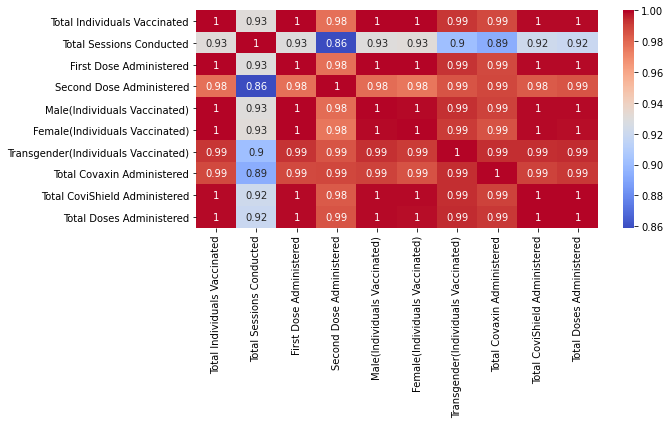

In [32]:
#Heatmap
plt.figure(figsize=(9, 4))
sns.heatmap(correl2.corr(), annot=True, cmap="coolwarm")

In [33]:
#show how many nulls
covid_vaccine_statewise.isnull().sum()

Updated On                                0
State                                     0
Total Individuals Vaccinated             40
Total Sessions Conducted                 40
Total Sites                              40
First Dose Administered                  40
Second Dose Administered                 40
Male(Individuals Vaccinated)             40
Female(Individuals Vaccinated)           40
Transgender(Individuals Vaccinated)      40
Total Covaxin Administered               40
Total CoviShield Administered            40
Total Sputnik V Administered           4666
AEFI                                   2221
18-45 years (Age)                      2226
45-60 years (Age)                      2225
60+ years (Age)                        2225
Total Doses Administered                 37
dtype: int64

In [34]:
# removing columns having most null values
covid_vaccine_statewise = covid_vaccine_statewise.drop(['Total Sputnik V Administered','AEFI', '18-45 years (Age)','45-60 years (Age)','60+ years (Age)'], axis=1)

In [35]:
covid_vaccine_statewise.head()

,Updated On,State,Total Individuals Vaccinated,Total Sessions Conducted,Total Sites,First Dose Administered,Second Dose Administered,Male(Individuals Vaccinated),Female(Individuals Vaccinated),Transgender(Individuals Vaccinated),Total Covaxin Administered,Total CoviShield Administered,Total Doses Administered
0,16/01/2021,India,48276.0,3455.0,2957.0,48276.0,0.0,23757.0,24517.0,2.0,579.0,47697.0,48276.0
1,17/01/2021,India,58604.0,8532.0,4954.0,58604.0,0.0,27348.0,31252.0,4.0,635.0,57969.0,58604.0
2,18/01/2021,India,99449.0,13611.0,6583.0,99449.0,0.0,41361.0,58083.0,5.0,1299.0,98150.0,99449.0
3,19/01/2021,India,195525.0,17855.0,7951.0,195525.0,0.0,81901.0,113613.0,11.0,3017.0,192508.0,195525.0
4,20/01/2021,India,251280.0,25472.0,10504.0,251280.0,0.0,98111.0,153145.0,24.0,3946.0,247334.0,251280.0


Regression Plot between Total Covaxin Administered and Total CoviShield Administered


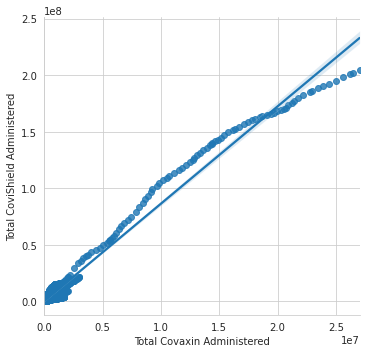

In [59]:
sns.set_style('whitegrid')
sns.lmplot(x ='Total Covaxin Administered', y ='Total CoviShield Administered', data = covid_vaccine_statewise)
print("Regression Plot between Total Covaxin Administered and Total CoviShield Administered")

# Use Pandas-Profiling for Covid_Vaccine_statewise

In [36]:
profile1= ProfileReport(covid_vaccine_statewise, title="covid_vaccine_statewise", html={'style':{'full_width':False}})

In [37]:
profile1.to_notebook_iframe()

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Display Data

# Total Individuals Registered For Vaccines Visualization

In [38]:
mask = (covid_vaccine_statewise["State"]=="India")
x3 = covid_vaccine_statewise[mask]["Updated On"]

In [39]:
y3 = covid_vaccine_statewise[mask]["Total Individuals Vaccinated"]

In [40]:
fig = px.line(x = x3, y = y3,color_discrete_sequence=px.colors.qualitative.Dark2,
       title="Total Individuals Registering for vaccines")

fig.update_xaxes(title_text="Dates")
fig.update_yaxes(title_text="Number of Persons Registered")

fig.show()

# Vaccination Related Data To **Jammu & Kashmir**

In [41]:
Jammu_kashmir = covid_vaccine_statewise[covid_vaccine_statewise["State"]=='Jammu and Kashmir']

In [42]:
fig = px.line(Jammu_kashmir,x="Updated On",y="Total Individuals Vaccinated",title="Total Number of  are Individuals Vaccinated from day to day-->Jammu_kashmir")  
fig.update_xaxes(rangeslider_visible=True) 

In [43]:
fig = px.line(Jammu_kashmir,x="Updated On",y="Total Sessions Conducted",title="Total Number of sessions are conducted from day to day-->Jammu_kashmir")  
fig.update_xaxes(rangeslider_visible=True)

In [44]:
male = Jammu_kashmir["Male(Individuals Vaccinated)"].sum() 
female = Jammu_kashmir["Female(Individuals Vaccinated)"].sum()  
trans = Jammu_kashmir["Transgender(Individuals Vaccinated)"].sum()
px.pie(names=["Male Vaccinated","Female Vaccinated","Trans Gender"],values=[male,female,trans],title="Male and Female Vaccinated ratio for Covid19-->Jammu_Kashmir")

In [45]:
first = Jammu_kashmir["First Dose Administered"].sum() 
second = Jammu_kashmir["Second Dose Administered"].sum()
px.pie(names=["First Dose","Second dose"],values=[first,second],title ="First and Second dosage ratio for covid in Jammu_kashmir")

# Vaccination Related Data to **Haryana** **bold text**

In [46]:
haryana = covid_vaccine_statewise[covid_vaccine_statewise["State"]=='Haryana']

In [47]:
fig = px.line(haryana,x="Updated On",y="Total Individuals Vaccinated",title="Total Number of  are Individuals  are registering from day to day-->Haryana")  
fig.update_xaxes(rangeslider_visible=True) 

In [48]:
fig = px.line(haryana,x="Updated On",y="Total Sessions Conducted",title="Total Number of sessions are conducted from day to day-->Haryana")  
fig.update_xaxes(rangeslider_visible=True)

In [49]:
male = haryana["Male(Individuals Vaccinated)"].sum() 
female = haryana["Female(Individuals Vaccinated)"].sum()  
trans = haryana["Transgender(Individuals Vaccinated)"].sum()
px.pie(names=["Male Vaccinated","Female Vaccinated","Trans Gender"],values=[male,female,trans],title="Male and Female Vaccinated ratio for Covid19-->Haryana")

In [50]:
first = haryana["First Dose Administered"].sum() 
second = haryana["Second Dose Administered"].sum()
px.pie(names=["First Dose","Second dose"],values=[first,second],title ="First and Second dosage ratio for covid in haryana")